## Kiva Loan Funding - Data Wrangling

**PURPOSE**: Predict which microfinance loans will be funded and how quickly they will be funded

**STEPS:**
+ Data Import & Cleaning
+ Exploratory Data Analysis 


**AUTHOR** : Maureen Wiebe

**DATA SOURCES**:<br> 
- Kiva Developer Tools: https://www.kiva.org/build/data-snapshots
    
**REV DATE**: 4-10-2020

In [1]:
import pandas as pd 
from datetime import datetime
import matplotlib.pyplot as plt
import seaborn as sns
from pandas_profiling import ProfileReport
pd.set_option('max_columns', None)

### Data Import

Smaller dataset representing the last 6 months of 2019 was pickled from the original dataset.

In [2]:
loans_2019 = pd.read_pickle('C:/Users/mwalz2/Documents/Python/Springboard/Kiva_Capstone_Project/data/interim/loans_2019.pkl')

In [3]:
#create pandas profiling report for loans2019
profile = ProfileReport(loans_2019, title='Loans Pandas Profiling Report', explorative = True)

profile

Summarize dataset:   0%|          | 0/47 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

In [4]:
loans_2019.head()

,LOAN_ID,LOAN_NAME,ORIGINAL_LANGUAGE,DESCRIPTION,DESCRIPTION_TRANSLATED,FUNDED_AMOUNT,LOAN_AMOUNT,STATUS,IMAGE_ID,VIDEO_ID,ACTIVITY_NAME,SECTOR_NAME,LOAN_USE,COUNTRY_CODE,COUNTRY_NAME,TOWN_NAME,CURRENCY_POLICY,CURRENCY_EXCHANGE_COVERAGE_RATE,CURRENCY,PARTNER_ID,POSTED_TIME,PLANNED_EXPIRATION_TIME,DISBURSE_TIME,RAISED_TIME,LENDER_TERM,NUM_LENDERS_TOTAL,NUM_JOURNAL_ENTRIES,NUM_BULK_ENTRIES,TAGS,BORROWER_NAMES,BORROWER_GENDERS,BORROWER_PICTURED,REPAYMENT_INTERVAL,DISTRIBUTION_MODEL
0,1904314,Nainasa,English,57 Year old Nainasa a market seller says that...,57 Year old Nainasa a market seller says that...,700.0,700.0,funded,3335953.0,NaN,Fruits & Vegetables,Food,To start planting kava and ginger,FJ,Fiji,Nawamagi,standard,NaN,FJD,562.0,2019-12-30 23:26:32+00:00,2020-02-15 08:00:35.000 +0000,2019-12-06 08:00:00.000 +0000,2020-01-01 18:54:49.000 +0000,14.0,25,1,1,"#Woman Owned Biz, #Elderly, user_favorite, #Vegan",Nainasa,female,true,monthly,field_partner
1,1904313,Grupo Las Palmas Monzon Group,Spanish,Francisca es madre de familia con 26 años de e...,Francisca is the mother to a family. She is 2...,150.0,2100.0,expired,3348199.0,NaN,Clothing Sales,Clothing,"to buy traditional clothing to sell, such as g...",GT,Guatemala,Suchitepéquez,shared,0.1,GTQ,246.0,2019-12-30 23:16:30+00:00,2020-02-14 12:40:14.000 +0000,2019-12-07 08:00:00.000 +0000,NaN,14.0,6,1,1,#Parent,"Francisca, Manuel, Saqueo","female, male, male","true, true, true",monthly,field_partner
2,1904312,Nanise,English,Nanise has seen the increase in her clientele ...,Nanise has seen the increase in her clientele ...,3250.0,3250.0,funded,3336034.0,NaN,Catering,Food,To buy more catering materials and a bigger st...,FJ,Fiji,Labasa,standard,NaN,FJD,562.0,2019-12-30 23:14:11+00:00,2020-02-16 19:00:11.000 +0000,2019-11-29 08:00:00.000 +0000,2020-02-01 13:56:30.000 +0000,14.0,114,1,1,"user_favorite, #Elderly, #Woman Owned Biz, #Re...",Nanise,female,true,monthly,field_partner
3,1904311,Doris,Spanish,Doris es una joven emprendedora que se dedica ...,Doris is a young entrepreneur who has been mak...,900.0,900.0,funded,3348197.0,NaN,Bakery,Food,to buy construction materials to enlarge her h...,CR,Costa Rica,San José,shared,0.0,CRC,127.0,2019-12-30 23:03:48+00:00,2020-02-14 12:40:04.000 +0000,2019-12-13 08:00:00.000 +0000,2020-01-01 13:54:08.000 +0000,26.0,32,1,1,"user_favorite, #Repeat Borrower, user_favorite...",Doris,female,true,monthly,field_partner
4,1904310,Makitalena,English,Makitalena at just 38 is now finally trying to...,Makitalena at just 38 is now finally trying to...,700.0,700.0,funded,3336041.0,NaN,Bakery,Food,"To pay for basic baking items such as trays, h...",FJ,Fiji,Nagigi,standard,NaN,FJD,562.0,2019-12-30 23:01:40+00:00,2020-02-15 08:00:35.000 +0000,2019-12-05 08:00:00.000 +0000,2020-01-01 22:30:36.000 +0000,14.0,27,1,1,"#Woman Owned Biz, user_favorite, user_favorite...",Makitalena,female,true,monthly,field_partner


In [5]:
loans_2019.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 109483 entries, 0 to 109482
Data columns (total 34 columns):
 #   Column                           Non-Null Count   Dtype              
---  ------                           --------------   -----              
 0   LOAN_ID                          109483 non-null  int64              
 1   LOAN_NAME                        108859 non-null  object             
 2   ORIGINAL_LANGUAGE                108860 non-null  object             
 3   DESCRIPTION                      108860 non-null  object             
 4   DESCRIPTION_TRANSLATED           108860 non-null  object             
 5   FUNDED_AMOUNT                    109483 non-null  float64            
 6   LOAN_AMOUNT                      109483 non-null  float64            
 7   STATUS                           109483 non-null  object             
 8   IMAGE_ID                         108860 non-null  float64            
 9   VIDEO_ID                         55 non-null      float64  

In [6]:
loans_2019.describe().round(2)

,LOAN_ID,FUNDED_AMOUNT,LOAN_AMOUNT,IMAGE_ID,VIDEO_ID,CURRENCY_EXCHANGE_COVERAGE_RATE,PARTNER_ID,LENDER_TERM,NUM_LENDERS_TOTAL,NUM_JOURNAL_ENTRIES,NUM_BULK_ENTRIES
count,109483.00,109483.00,109483.00,108860.00,55.0,81650.00,109072.00,109483.00,109483.00,109483.00,109483.00
mean,1847192.76,707.03,743.63,3257878.92,4295.0,0.08,210.68,13.35,18.46,1.19,1.01
std,32835.15,1270.90,1295.22,73892.58,61.3,0.04,137.04,6.46,31.96,0.61,0.23
min,1790535.00,0.00,25.00,634680.00,4173.0,0.00,9.00,3.00,0.00,1.00,1.00
25%,1818753.50,200.00,200.00,3225139.75,4250.5,0.10,137.00,8.00,6.00,1.00,1.00
50%,1847023.00,425.00,450.00,3264023.50,4292.0,0.10,156.00,14.00,11.00,1.00,1.00
75%,1875542.50,800.00,850.00,3305365.50,4345.5,0.10,243.00,14.00,21.00,1.00,1.00
max,1904314.00,100000.00,100000.00,3380844.00,4396.0,0.10,604.00,142.00,3232.00,90.00,45.00


### Data Cleaning

In [7]:
#remove all rows with status = refunded
#what is currency policy(shared vs. standard) and what is currency exchange coverage rate -- Risk sharing feature on Kiva that requires Field partners either cover the first 10% of currency losses or otherwise all losses are covered by (micro)lenders
#determine who is partner iD 145 (20%+ of loans) Philippines Negro Women for Tomorrow Foundation
#what is lender term (int number) - Number of months to repay the loan
#look at extreme values for # of lenders
#determine what bulk entries means consider dropping
#Ask Reza about extracting common words from tags column; how to then utilize
#create column for # of borrowers 
#create column to summarize if there is a woman in the group of borrowers 
#98% of borrowers are pictured should this be dropped?
#could drop borrower name doesn't seem to have relevance... unless we wanted to look at foreign names vs. english names 
#what does bullet repayment - single lump sum 
#should we look at direct and field partner distribution models separately 
#Change on Kiva in 2019 where the amount raised regardless if loan is 100% funded will now be sent to the borrower (might make sense to look at 2018 instead of 2019....)

#### Date Formatting 
Changed all of the date columns to date time format.

In [8]:
#change all of the date columns to datetime to allow for calculations
loans_2019['POSTED_TIME'] = pd.to_datetime(loans_2019['POSTED_TIME'] )
loans_2019['DISBURSE_TIME'] = pd.to_datetime(loans_2019['DISBURSE_TIME'] )
loans_2019['PLANNED_EXPIRATION_TIME']= pd.to_datetime(loans_2019['PLANNED_EXPIRATION_TIME'])
loans_2019['RAISED_TIME']= pd.to_datetime(loans_2019['RAISED_TIME'])

#### Missing Data

There are minimal missing values in the data besides the video_id field. This feature will be dropped.  The other two fields with higher degrees of "missing-ness" are currency exchange coverage rate and tags. The currency exchange rate is directly tired to the currency policy (shared or standard).  With standard there is no coverage rate and the field is therefore blank. The tag field is "tagging" the loan with certain characteristics and not every loan was tagged.  Both of these fields will be left as is. 

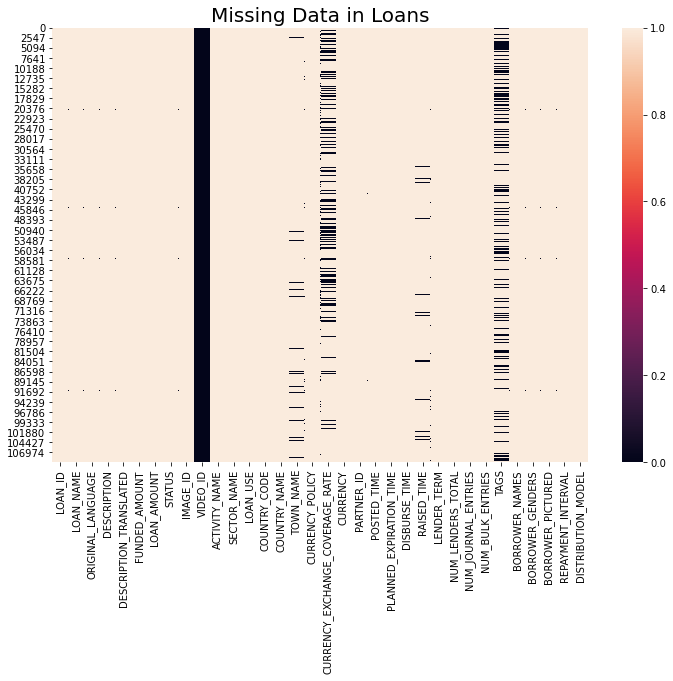

In [9]:
plt.subplots(figsize=(12,8))
sns.heatmap(~loans_2019.isna(),xticklabels = True)
plt.title("Missing Data in Loans",fontsize =20)
plt.show()

#### Video_Id

In [10]:
#drop video_id column 99% missing  

loans_2019.drop(['VIDEO_ID'], axis = 1, inplace = True)

#### Status 
The status column is the outcome variable we are looking to predict. It is a categorical variable indicating if the loan was funded or expired. There is one other value currently in the status column, refunded. Loans that are refunded are loans that the borrower returned to Kiva before using the funds. Key information is not included about these loans so they will be dropped from the dataset. 

In [11]:
loans_2019.STATUS.value_counts()

funded      104705
expired       4155
refunded       623
Name: STATUS, dtype: int64

In [12]:
#remove all rows with status = refunded; 623 loans 

loans_2019.drop(loans_2019[loans_2019.STATUS =='refunded'].index, inplace = True)

#### Image ID 
Every loan has an associated image since no additional information can be gained by the ID of the image this column will be dropped.

In [13]:
loans_2019.drop(['IMAGE_ID'], axis = 1, inplace = True)

### Individual Features 

The Pandas Profile report was used to explore each feature.  

1. The loan amount for the vast majority of loans is < \\$900 but there are loan outliers up to $100,000 causing a skewed distribution.  

2. The loans are posted in 15 different sectors that contain 163 distinct activities to further segregate them. 

3. Over 25% of the loans are made to borrowers in the Phillipines. There are 65 additional unique countries where borrowers recieved loans. 

4. There are two different currency exchange policies.  Shared: the Field Partner takes on risk associated with currency fluctuations and is responsible for the first X% of currency losses(X is defined in the currency exchange coverage rate). Standard: all risk is shared and any currency exchange losses are covered by ALL lenders.  

5. There is one field partner (145 - Philippines Negro Women for Tomorrow Foundation ) that accounts for 20%+ of all the loans made. 

6. The lender terms for the vast majority of loans is < 14 months but there are outliers up to 140 months casusing a skewed distribution.  

7. The number of lenders per loan seems to relate to the size of the loan. Lenders can lend in increments of $25 and it is uncommon for a single lender to fund an entire loan.  

8. There are three different ways that loans can be repaid.  The most common is monthly.  The other two options are bullet: one-time lump payment or irregular: payments are not made at regular intervals by lender is still tied to the overall lending terms. 

9. There are two different ways that loans are distributed. Less than 0.05% of loans are "direct" meaning the funds are distributed directly from Kiva to the borrower.  The vast majority of loans go through a Field Partner which is an organization on the ground that connects individual borrowers with the Kiva platform and disburses the loan.  


In [14]:
#create pandas profiling report for loans2019
profile = ProfileReport(loans_2019, title='Loans Pandas Profiling Report', explorative = True)

profile

Summarize dataset:   0%|          | 0/46 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

### New Features
To provide more information during the analysis phase additional information will be added based on exisiting information.   

#### Total Borrowers per Loan

In [15]:
#create list that contains number of borrowers by counting the number of names associated with each loan
borrower_list = loans_2019['BORROWER_NAMES'].str.split(',')
NUM_BORROWERS_TOTAL =[]
for i, value in borrower_list.items(): 
    if isinstance(value, list):
        NUM_BORROWERS_TOTAL.append(len(value))
    else: 
        NUM_BORROWERS_TOTAL.append(1)

In [16]:
#insert number of borrowers into the loans_2019 dataframe
loans_2019.insert(27,'NUM_BORROWERS_TOTAL',list(NUM_BORROWERS_TOTAL))

#### Borrower(s)'s Gender

In [17]:
#insert column to identify if any male borrowers are part of the loan into loans_2019 dataframe
loans_2019.insert(30,'FEMALE_ONLY_LOAN', 1)

#identify any loans that include males 
indices = loans_2019[(loans_2019.BORROWER_GENDERS.notna()) & (loans_2019.BORROWER_GENDERS.str.contains(".*female.*\\bmale.*"))| (loans_2019.BORROWER_GENDERS =='male')].index

#update column to identify loans including males 
loans_2019.loc[indices,'FEMALE_ONLY_LOAN'] =0

#### Loan Tags 
Individual loans are given "hashtags" indicating relevant information that might appeal to a lender like: "woman owned business" or "first time loan".   These tags were all located in a single field and so will be parsed out to further categorize each loan.

In [18]:
#Identify the most common tags 
loan_tags = loans_2019['TAGS'].str.split('#|,')
TAGS_DICT ={}
for i, tags in loan_tags.items():
    if isinstance(tags, list):
        for tag in tags: 
            if tag.strip() in TAGS_DICT:
                TAGS_DICT[tag.strip()] += 1
            else:
                TAGS_DICT[tag.strip()] = 1
del TAGS_DICT['']

In [19]:
#replace all Nan values with empty list to allow for looping
indices = loan_tags[loan_tags.isna()].index
loan_tags[indices]=loan_tags[indices].apply(lambda d: d if isinstance(d, list) else [])

#remove all whitespaces from tags
for i, tags in loan_tags.items():
    loan_tags[i] = [tag.strip() for tag in tags]

In [20]:
#create dataframe with columns corresponding to tags 
tag_df = pd.DataFrame()
column_names = []
tag_present = []

for key in TAGS_DICT.keys():
    column_names.append('Tag_'+key)
    for i, tags in loan_tags.items():
        if (key in tags):
            tag_present.append(1)
        else: 
            tag_present.append(0)
    tag_df['Tag_'+key] = tag_present
    tag_present = []

In [21]:
#merge dataframe with tag columns to original dataframe 

loans_2019 = pd.concat([loans_2019, tag_df], axis=1, join = "inner") 

#### Loan Description - Activity Name
Each loan is categorized into a sector (Food, Clothing, etc.).  The loan is then subcategorized into an activity.  A food loan could be subcategorized into Bakery or Catering for example.  There is even more specific information given in the Loan Use column but this is distinct for each loan.  To allow for more granular understanding the loan activities will be expanded out.  

In [22]:
#Create dummy variables for all of the activities names 

dummies = pd.get_dummies(loans_2019.ACTIVITY_NAME, drop_first=True).rename(columns=lambda x: 'Activity_' + str(x))

loans_2019 = pd.concat([loans_2019, dummies], axis=1)

#### Loan Status  

In [23]:
#Create dummy variable for the STATUS column
dummies = pd.get_dummies(loans_2019.STATUS, drop_first=True).rename(columns=lambda x: 'Status_' + str(x))

loans_2019 = pd.concat([loans_2019, dummies], axis=1)

#### Average Amount Loaned per Lender

In [24]:
#add another column that calculates the average amount each lender put towards the loan 
loans_2019['AVG_LENDER_AMT'] = round(loans_2019.FUNDED_AMOUNT/loans_2019.NUM_LENDERS_TOTAL,0)

#### Time to Fund Loan

In [25]:
#Add column that calculates the number of hours that it took to get a loan funded 
loans_2019.insert(23,'RAISED_HOURS',round(pd.to_timedelta(loans_2019.RAISED_TIME - loans_2019.POSTED_TIME)/ pd.Timedelta('1 hour'),2))

#### Funded Percent (Expired Loans)

In [26]:
#add column that calculates what % the loan was funded (i.e. if expired how close was it to reaching funding)

loans_2019.insert(7,'FUNDED_PERCENT', round(loans_2019.FUNDED_AMOUNT/loans_2019.LOAN_AMOUNT,2))


#### Currency Policy & Currency Exchange Rate 
Kiva has established two different options for their field partners to manage the fluctuations in exchange rates. The first policy is a shared model where the Field Partner takes on risk associated with currency fluctuations and is responsible for the first 10% of currency losses. The second model called the standard model is setup where all risk is shared and any currency exchange losses are covered by ALL lenders rather than the field partners bearing the responsibility. This is not clearly distinguished based on the combination of the currency policy and currency exchange rate features.  A new column that combines the information from these two columns will be added.  

In [29]:
loans_2019.insert(17,'CURRENCY_EXCHANGE_RATE_CALC', loans_2019.CURRENCY_EXCHANGE_COVERAGE_RATE)

In [33]:
loans_2019.CURRENCY_EXCHANGE_RATE_CALC.fillna(0,inplace =True)

#### Seasonality 
There appears to the funding of the loan based on the time of year.   A column will be added to indicate the month which will be used to tease out this trend.  

In [36]:
loans_2019.insert(20,'MONTH', loans_2019.POSTED_TIME.dt.month)

## Save Cleaned Data

In [38]:
loans_2019.to_pickle('C:/Users/mwalz2/Documents/Python/Springboard/Kiva_Capstone_Project/data/interim/loans_2019_clean.pkl')